# Base Visualization 

## 0. Import Library

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import torch

import re

import warnings
warnings.filterwarnings(action='ignore')

def set_seed(seed: int) -> None:
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)

seed = 1234
set_seed(seed)

In [2]:
import matplotlib.pyplot as plt
from matplotlib import font_manager, rc

# 나눔 폰트 경로를 직접 설정 
font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
fontprop = font_manager.FontProperties(fname=font_path)
plt.rcParams['font.family'] = fontprop.get_name()

In [3]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [4]:
# Hugging Face의 병렬 처리가 비활성화
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

In [5]:
# max_len 도출
from typing import List

def calculate_optimal_max_len(lengths: List[int], thresholds=[64, 128, 256, 512], percentile=90) -> int:
    """
    Calculates the optimal max_len based on the specified percentile of the lengths.
    
    Args:
        lengths (List[int]): List of lengths of each text sample.
        thresholds (List[int]): Possible threshold values to choose from.
        percentile (int): The percentile to use as the cutoff for length.

    Returns:
        int: The optimal max_len based on the given percentile.
    """
    # Calculate the length at the specified percentile
    max_len_suggestion = np.percentile(lengths, percentile)
    
    # Find the closest threshold
    optimal_max_len = min(thresholds, key=lambda x: abs(x - max_len_suggestion))
    
    # Plot length distribution and percentile line
    plt.hist(lengths, bins=30, alpha=0.6, color='b', edgecolor='black')
    plt.axvline(max_len_suggestion, color='red', linestyle='--', label=f'{percentile}th percentile = {int(max_len_suggestion)}')
    plt.axvline(optimal_max_len, color='green', linestyle='-', label=f'Chosen max_len = {optimal_max_len}')
    plt.xlabel('Text Length')
    plt.ylabel('Frequency')
    plt.title('Text Length Distribution with Optimal max_len')
    plt.legend()
    plt.show()
    
    return optimal_max_len

In [6]:
from sklearn.metrics.pairwise import euclidean_distances, cosine_similarity
import matplotlib.pyplot as plt
import seaborn as sns

def visualize_similarity_distance(vector1, vector2, label1="Vector1", label2="Vector2"):

    # 코사인 유사도 및 유클리디안 거리 계산
    similarity_block = cosine_similarity(vector1, vector2)
    euc_distances = euclidean_distances(vector1, vector2)
    
    # 시각화
    plt.figure(figsize=(12, 5))
    
    # 코사인 유사도 히트맵
    plt.subplot(1, 2, 1)
    sns.heatmap(similarity_block, cmap="YlGnBu", xticklabels=False, yticklabels=False)
    plt.title("Cosine Similarity")
    plt.xlabel(label1)
    plt.ylabel(label2)
    
    # 유클리디안 거리 히트맵
    plt.subplot(1, 2, 2)
    sns.heatmap(euc_distances, cmap="YlGnBu", xticklabels=False, yticklabels=False)
    plt.title("Euclidean Distance")
    plt.xlabel(label1)
    plt.ylabel(label2)
    
    plt.tight_layout()
    plt.show()


## 1. Load Data

In [7]:
train = pd.read_csv('data/train_data.csv')
valid = pd.read_csv('data/val_data.csv')
test = pd.read_csv('data/test_data.csv')

In [8]:
train

,class,text
0,i,2) 또한 자동차 열쇠에 대한 배타적인 점유를 취득하는 이상 인근에 주차된 해당 자...
1,w,자기의 행위로 인하여 타인의 사망이라는 결과를 발생시킬 만한 가능성 또는 위험이 있...
2,u,이 사건의 경우 앞서 든 증거들에 의하여 인정되는 다음과 같은 사정들을 고려하여보면
3,c,나. 피고인은 본건 범행 당시 술에 취하여 심신상실 또는 심신미약의 상태에 있었다.
4,d,② 피해자가 피고인에게 먼저 시비를 걸며 부엌에 있던 식칼을 꺼내들고 피고인을 위협...
...,...,...
4073,d,"③ 피고인은 주방으로 가서,"
4074,e,4 M병원에서 작성한 의무기록사본에는 아래와 같은 내용이 기재되어 있다
4075,i,"피고인은 이 사건 범행 당시 우울증 등 정신질환이 있었고,"
4076,c,피고인이 이 사건 범행 당시 음주로 인하여 사물을 변별하거나 의사를 결정할 능력이 ...


In [9]:
valid

,class,text
0,i,"피해자가 입은 상해의 부위 및 정도는 사망에 이를 수 있는 정도의 위험한 수준이었고,"
1,c,이 사건 범행 당시 피고인에게 미필적으로나마 살인의 범의가 있었음을 충분히 인정할 ...
2,e,"이러한 손상은 둔기에 의해 발생 가능한 손상으로 보인다는 소견을 밝히고 있는 점,"
3,c,"피고인 A에게 살인의 고의는 없었고,"
4,c,피고인이 이 사건 범행 당시 음주로 인하여 사물을 변별할 능력이나 의사를 결정할 능...
...,...,...
1930,e,차량 내부에서 발화가 시작된 경우에도 차량 자체의 전기적 문제가 점화원이 될 수 있는데
1931,ic,피고인과 변호인의 이 부분 주장은 받아들이지 않는다.
1932,c,"피고인과 변호인은, 피고인이 이 사건 살인미수의 범행 당시 술에 취하여 심신미약상태..."
1933,d,피고인이 이 사건 범행 당시 조현병을 앓고 있던 사정은 인정되나


In [10]:
test

,class,text
0,u,"이 법원이 적법하게 채택하여 조사한 증거에 의하여 인정되는 아래와 같은 사정 즉,"
1,u,"위와 같은 사정들을 모아보면,"
2,u,"앞서 살핀 증거에 의하여 인정되는 다음과 같은 사실 또는 사정을 종합하면,"
3,u,"피고인과 변호인은,"
4,d,(증거기록 제178쪽).
...,...,...
775,b,(2010. 11. 11. 선고 2010도9869 판결 등 참조).
776,d,"피해자를 밀쳐 방바닥으로 떨어뜨리고,"
777,i,피고인은 최초에 칼을 가지고 왔을 때에는 피해자에게 위협만 가할 의사였을 지라도 피...
778,i,"식칼로 피고인을 찌를 의식 없음은 분명하게 표시한 것이고,"


In [11]:
train.describe()

,class,text
count,4078,4078
unique,8,3832
top,d,"살피건대,"
freq,1360,11


In [12]:
valid.describe()

,class,text
count,1935,1935
unique,8,1852
top,d,위 주장은 받아들이지 아니한다.
freq,687,6


In [13]:
test.describe()

,class,text
count,780,780
unique,8,755
top,d,(대법원 2009. 2. 26. 선고 2008도9867 판결 등 참조).
freq,274,4


## 2. Embedding
Load Model 

In [14]:
# KLUE RoBERTa 모델과 토크나이저 설정
from transformers import AutoModel, AutoTokenizer

model_name = "klue/roberta-base"
tokenizer = AutoTokenizer.from_pretrained(model_name, use_fast=False)
model = AutoModel.from_pretrained(model_name).to(device)

2024-11-20 11:20:41.272561: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-20 11:20:41.278946: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-20 11:20:41.286403: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-20 11:20:41.288680: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-20 11:20:41.294543: I tensorflow/core/platform/cpu_feature_guar

In [15]:
from collections import Counter
# 토큰화
tokens = [token for sentence in train["text"] for token in tokenizer.tokenize(sentence)]

# 토큰 빈도 계산
token_counts = Counter(tokens)

# 빈도가 높은 상위 30개 서브워드 출력
print(token_counts.most_common(30))

[('##의', 3605), (',', 3214), ('##을', 2994), ('##에', 2965), ('##이', 2472), ('##는', 2456), ('.', 2328), ('피고인', 2309), ('피해자', 2229), ('##은', 1860), ('##를', 1733), ('있', 1441), ('##고', 1426), ('##가', 1280), ('##하', 1234), ('##다', 1155), ('##한', 1033), ('것', 1020), ('범행', 994), ('##로', 989), ('##었', 968), ('##으로', 927), ('##게', 915), ('이', 824), ('##에서', 722), ('##지', 696), ('등', 665), ('##였', 664), ('##도', 578), ('##과', 574)]


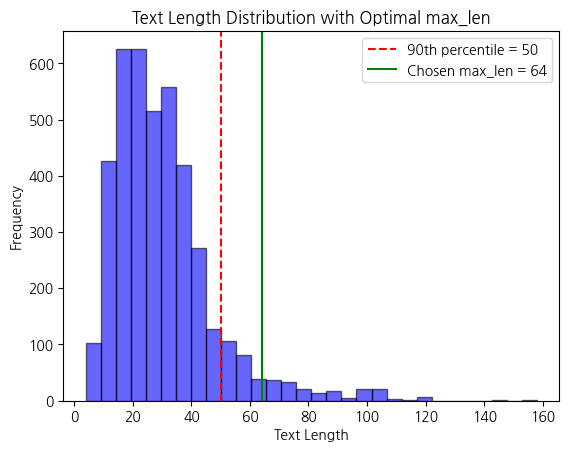

In [16]:
# max_len 길이 구하기
token_lengths = [len(tokenizer.encode(text)) for text in train["text"]]

# 최적의 max_len 계산
max_len = calculate_optimal_max_len(token_lengths)

In [17]:
from torch.utils.data import DataLoader, Dataset

# 1. 커스텀 데이터셋 정의
class CustomDataset(Dataset):
    def __init__(self, dataframe):
        self.data = dataframe
        self.texts = self.data.apply(lambda row: f"{row['class']} {row['text']}", axis=1)

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        return self.texts.iloc[idx]
    
# 2. 데이터셋 준비
train_dataset = CustomDataset(train)
valid_dataset = CustomDataset(valid)
test_dataset = CustomDataset(test)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=False)
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [18]:
# 3. 임베딩 생성 함수
def generate_embeddings(data_loader):
    embeddings = []
    model.eval()
    with torch.no_grad():
        for batch in data_loader:
            inputs = tokenizer(list(batch), return_tensors="pt", padding=True, truncation=True, max_length=512).to("cuda")
            outputs = model(**inputs)
            cls_embeddings = outputs.last_hidden_state[:, 0, :]  # [CLS] 토큰의 임베딩 사용
            embeddings.append(cls_embeddings.cpu())
    return torch.cat(embeddings).numpy()

# 데이터 임베딩 생성
train_embeddings = generate_embeddings(train_loader)
valid_embeddings = generate_embeddings(valid_loader)
test_embeddings = generate_embeddings(test_loader)

In [19]:
train_embeddings[:,]

array([[ 0.11617056, -0.6478729 , -0.12449905, ..., -0.14136402,
        -0.13365228,  0.17427932],
       [ 0.14338882, -0.669224  , -0.18163106, ..., -0.05930354,
        -0.11016949,  0.1383283 ],
       [ 0.18491176, -0.6629126 , -0.19189572, ..., -0.10797038,
        -0.0981001 ,  0.07542779],
       ...,
       [ 0.10490901, -0.7011277 , -0.16174008, ...,  0.01432661,
        -0.15327165,  0.12465222],
       [ 0.05359844, -0.60453594, -0.19915046, ..., -0.0075889 ,
        -0.15854223,  0.18308836],
       [ 0.07093946, -0.68771064, -0.22110109, ..., -0.0786672 ,
        -0.13991049,  0.07906687]], dtype=float32)

## 3. visualization

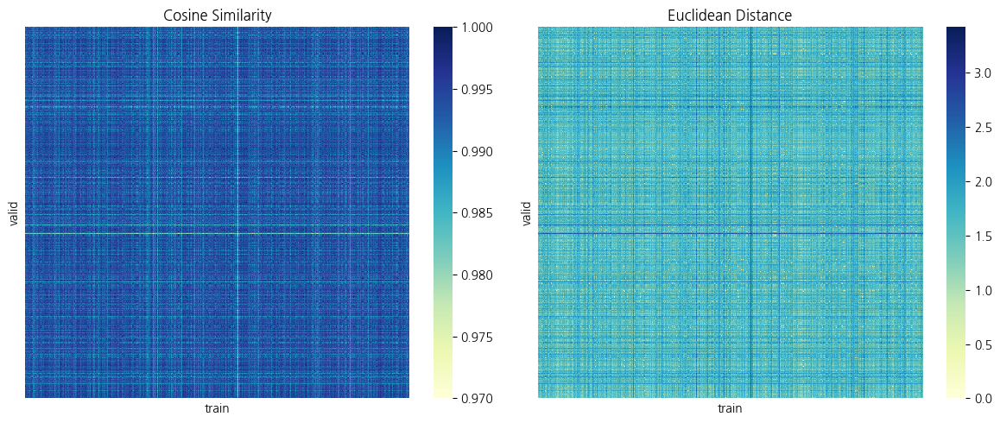

In [20]:
visualize_similarity_distance(train_embeddings, valid_embeddings, 'train', 'valid')

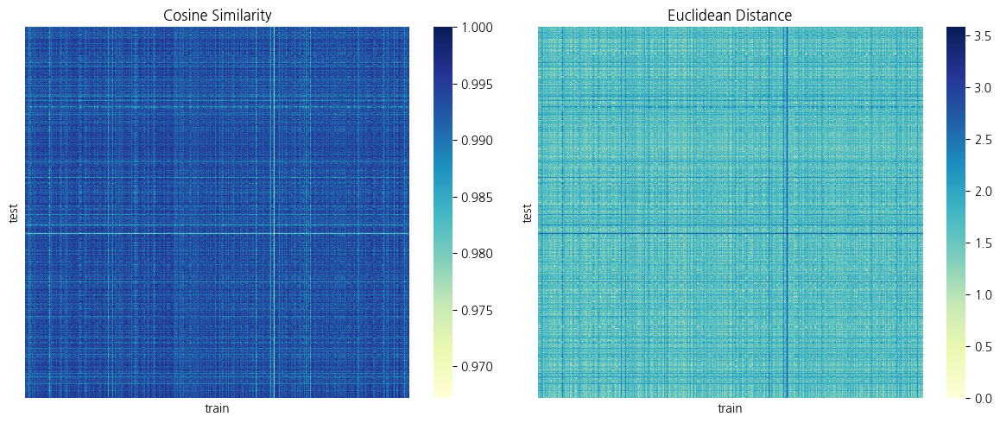

In [21]:
visualize_similarity_distance(train_embeddings, test_embeddings, 'train', 'test')

방향적으로 유사한 형태임을 알 수 있음

### 3.1 T-SNE
- 데이터 간의 세부적인 군집

In [44]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # 3D 시각화를 위한 모듈
import numpy as np

def tsne_plot_2d_3d(embedding_vector1, embedding_vector2, label1="Train", label2="Test"):
    # t-SNE 모델 초기화 및 학습 (2D와 3D 결과를 각각 생성)
    embeddings = np.vstack([embedding_vector1, embedding_vector2])  # 두 데이터를 하나로 결합
    tsne_model_2d = TSNE(
        perplexity=40,
        n_components=2,
        init="random",  # PCA 초기화 대신 무작위 초기화
        n_iter=2500,
        random_state=23
    )
    tsne_model_3d = TSNE(
        perplexity=40,
        n_components=3,
        init="random",  # PCA 초기화 대신 무작위 초기화
        n_iter=2500,
        random_state=23
    )

    tsne_values_2d = tsne_model_2d.fit_transform(embeddings)
    tsne_values_3d = tsne_model_3d.fit_transform(embeddings)

    # 각 데이터의 분리된 레이블 생성
    labels = [label1] * len(embedding_vector1) + [label2] * len(embedding_vector2)

    # t-SNE 결과 분리
    x_2d, y_2d = tsne_values_2d[:, 0], tsne_values_2d[:, 1]
    x_3d, y_3d, z_3d = tsne_values_3d[:, 0], tsne_values_3d[:, 1], tsne_values_3d[:, 2]

    # 시각화 (1x2 서브플롯 생성)
    fig = plt.figure(figsize=(20, 8))

    # 2D 시각화
    ax1 = fig.add_subplot(1, 2, 1)
    for label in set(labels):
        idx = [i for i, lbl in enumerate(labels) if lbl == label]
        ax1.scatter(
            [x_2d[i] for i in idx],
            [y_2d[i] for i in idx],
            label=label,
            s=10, alpha=0.7
        )
    ax1.set_title("2D t-SNE Visualization: " + label1 + ' vs ' + label2, fontsize=15)
    ax1.set_xlabel("t-SNE Dimension 1", fontsize=12)
    ax1.set_ylabel("t-SNE Dimension 2", fontsize=12)
    ax1.legend(loc="best", fontsize=12)

    # 3D 시각화
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    for label in set(labels):
        idx = [i for i, lbl in enumerate(labels) if lbl == label]
        ax2.scatter(
            [x_3d[i] for i in idx],
            [y_3d[i] for i in idx],
            [z_3d[i] for i in idx],
            label=label,
            s=10, alpha=0.7
        )
    ax2.set_title("3D t-SNE Visualization: " + label1 + ' vs ' + label2, fontsize=15)
    ax2.set_xlabel("t-SNE Dimension 1", fontsize=12)
    ax2.set_ylabel("t-SNE Dimension 2", fontsize=12)
    ax2.set_zlabel("t-SNE Dimension 3", fontsize=12)
    ax2.legend(loc="best", fontsize=12)

    # 전체 플롯 표시
    plt.tight_layout()
    plt.show()


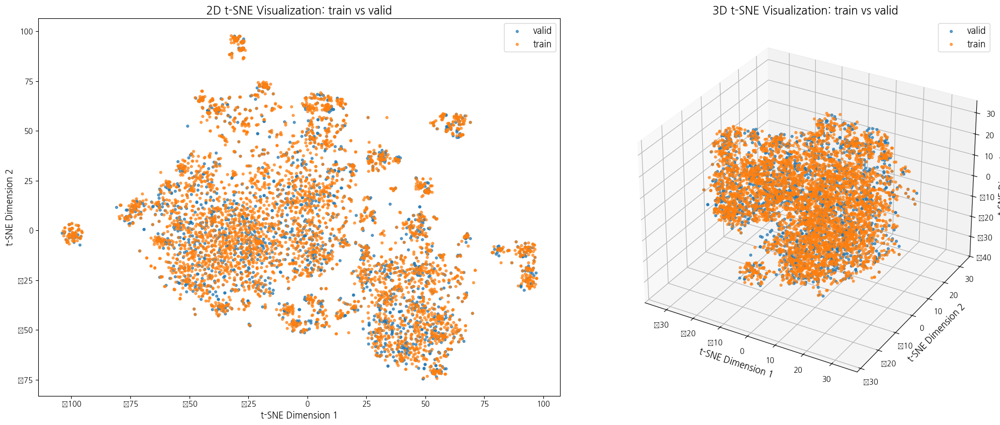

In [45]:
tsne_plot_2d_3d(train_embeddings, valid_embeddings, 'train', 'valid')

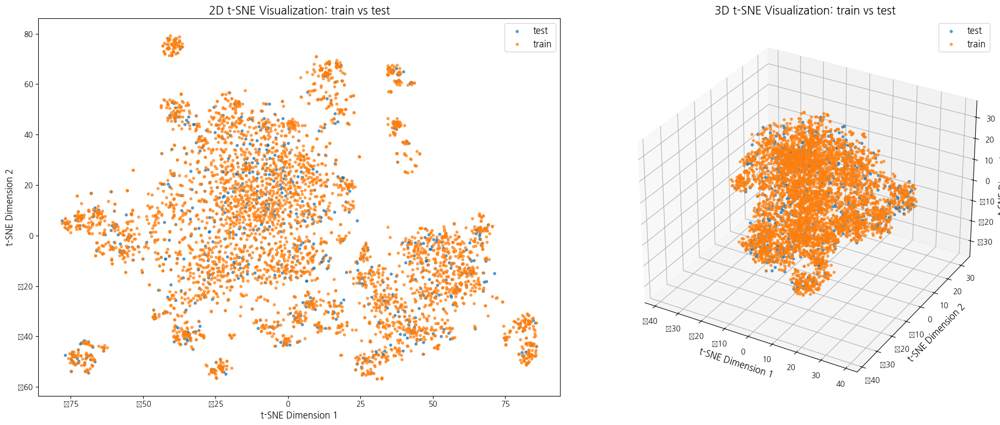

In [47]:
tsne_plot_2d_3d(train_embeddings, test_embeddings, 'train', 'test')

In [48]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import numpy as np

def tsne_density_plot_2d_3d_fixed(embedding_vector1, embedding_vector2, label1="Train", label2="Test"):
    """
    2D 및 3D t-SNE 밀도 플롯
    """
    # t-SNE 모델 학습
    embeddings = np.vstack([embedding_vector1, embedding_vector2])
    
    # 2D t-SNE
    tsne_2d_model = TSNE(n_components=2, perplexity=40, random_state=42)
    new_values_2d = tsne_2d_model.fit_transform(embeddings)
    
    # 3D t-SNE
    tsne_3d_model = TSNE(n_components=3, perplexity=40, random_state=42)
    new_values_3d = tsne_3d_model.fit_transform(embeddings)

    # 데이터 분리
    labels = [label1] * len(embedding_vector1) + [label2] * len(embedding_vector2)
    x_2d, y_2d = new_values_2d[:, 0], new_values_2d[:, 1]
    x_3d, y_3d, z_3d = new_values_3d[:, 0], new_values_3d[:, 1], new_values_3d[:, 2]

    # 1x2 크기의 그래프 생성
    fig = plt.figure(figsize=(16, 8))

    # 2D Density Plot
    ax1 = fig.add_subplot(121)
    sns.kdeplot(x=x_2d, y=y_2d, hue=labels, fill=True, palette="viridis", alpha=0.5, ax=ax1)
    ax1.set_title("2D t-SNE Density Plot: " + label1 + ' vs ' + label2, fontsize=15)
    ax1.set_xlabel("t-SNE Dimension 1")
    ax1.set_ylabel("t-SNE Dimension 2")

    # 3D Plot with label1/label2 distinction
    ax2 = fig.add_subplot(122, projection='3d')
    colors = {label1: 'blue', label2: 'red'}
    for label in set(labels):
        idx = [i for i, lbl in enumerate(labels) if lbl == label]
        ax2.scatter(
            [x_3d[i] for i in idx],
            [y_3d[i] for i in idx],
            [z_3d[i] for i in idx],
            c=colors[label],
            label=label,
            alpha=0.7,
            s=15
        )

    ax2.set_title("3D t-SNE Scatter Plot: " + label1 + ' vs ' + label2, fontsize=15)
    ax2.set_xlabel("t-SNE Dimension 1")
    ax2.set_ylabel("t-SNE Dimension 2")
    ax2.set_zlabel("t-SNE Dimension 3")
    ax2.legend(loc="best", fontsize=12)

    plt.tight_layout()
    plt.show()

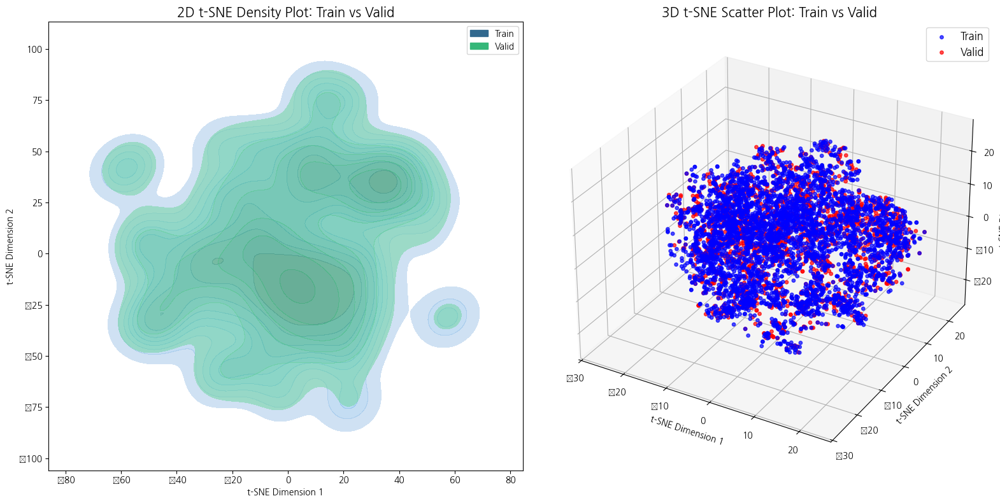

In [49]:
tsne_density_plot_2d_3d_fixed(train_embeddings, valid_embeddings, label1="Train", label2="Valid")

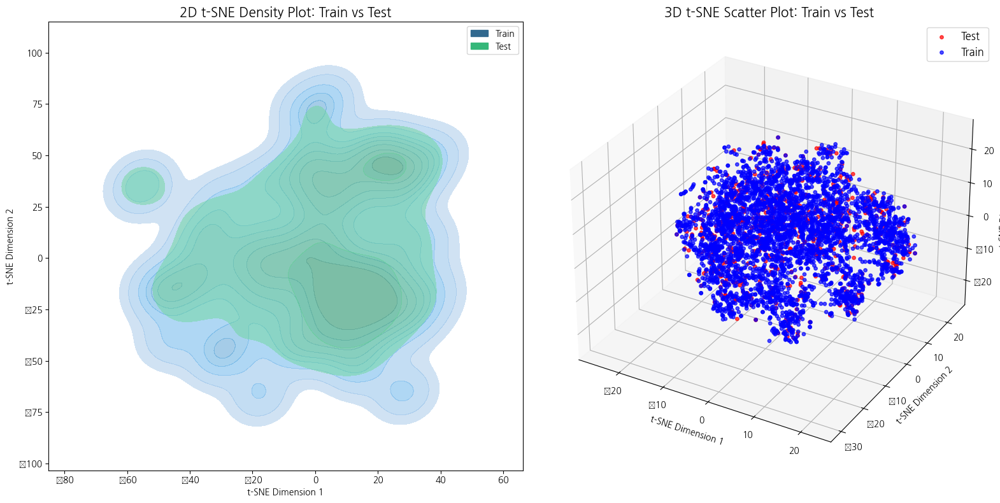

In [50]:
tsne_density_plot_2d_3d_fixed(train_embeddings, test_embeddings, label1="Train", label2="Test")

### 3.2 UMAP

- data 간의 전반적인 군집

In [ ]:
# import umap
import umap.umap_ as umap
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # 3D 시각화를 위한 모듈
import numpy as np

def umap_plot_2d_3d(embedding_vector1, embedding_vector2, label1="Train", label2="Test"):

    # UMAP 모델 초기화 및 학습 (2D와 3D 결과를 각각 생성)
    embeddings = np.vstack([embedding_vector1, embedding_vector2])  # 두 데이터를 하나로 결합
    umap_model_2d = umap.UMAP(n_components=2, random_state=42)
    umap_model_3d = umap.UMAP(n_components=3, random_state=42)

    umap_values_2d = umap_model_2d.fit_transform(embeddings)
    umap_values_3d = umap_model_3d.fit_transform(embeddings)

    # Train/Test 데이터의 분리된 레이블 생성
    labels = [label1] * len(embedding_vector1) + [label2] * len(embedding_vector2)

    # UMAP 결과 분리
    x_2d, y_2d = umap_values_2d[:, 0], umap_values_2d[:, 1]
    x_3d, y_3d, z_3d = umap_values_3d[:, 0], umap_values_3d[:, 1], umap_values_3d[:, 2]

    # 시각화 (1x2 서브플롯 생성)
    fig = plt.figure(figsize=(20, 8))

    # 2D 시각화
    ax1 = fig.add_subplot(1, 2, 1)
    for label in set(labels):
        idx = [i for i, lbl in enumerate(labels) if lbl == label]
        ax1.scatter(
            [x_2d[i] for i in idx],
            [y_2d[i] for i in idx],
            label=label,
            s=10, alpha=0.7
        )
    ax1.set_title("2D UMAP Visualization: " + label1 + ' vs ' + label2, fontsize=15)
    ax1.set_xlabel("UMAP Dimension 1", fontsize=12)
    ax1.set_ylabel("UMAP Dimension 2", fontsize=12)
    ax1.legend(loc="best", fontsize=12)

    # 3D 시각화
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    for label in set(labels):
        idx = [i for i, lbl in enumerate(labels) if lbl == label]
        ax2.scatter(
            [x_3d[i] for i in idx],
            [y_3d[i] for i in idx],
            [z_3d[i] for i in idx],
            label=label,
            s=10, alpha=0.7
        )
    ax2.set_title("3D UMAP Visualization: " + label1 + ' vs ' + label2, fontsize=15)
    ax2.set_xlabel("UMAP Dimension 1", fontsize=12)
    ax2.set_ylabel("UMAP Dimension 2", fontsize=12)
    ax2.set_zlabel("UMAP Dimension 3", fontsize=12)
    ax2.legend(loc="best", fontsize=12)

    # 전체 플롯 표시
    plt.tight_layout()
    plt.show()

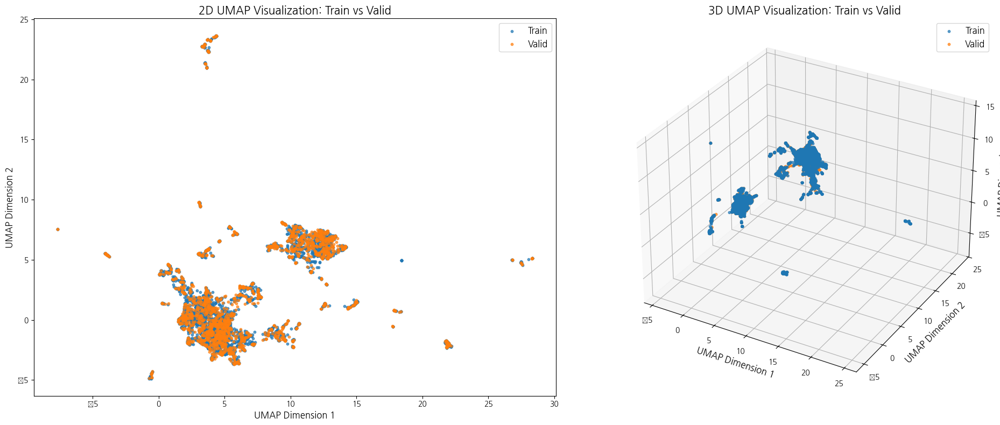

In [67]:
umap_plot_2d_3d(train_embeddings, valid_embeddings, label1="Train", label2="Valid")

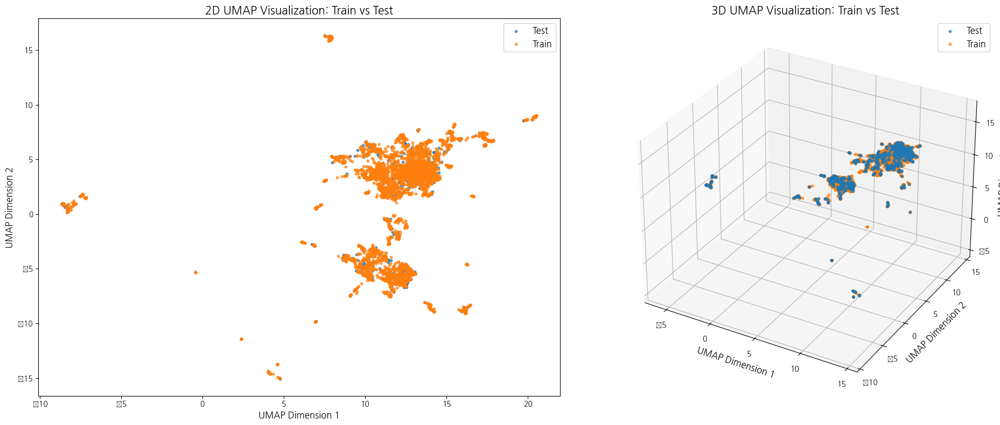

In [66]:
umap_plot_2d_3d(train_embeddings, test_embeddings, label1="Train", label2="Test")

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import umap.umap_ as umap

def umap_density_plot(train_embeddings, test_embeddings, label1="Train", label2="Test"):
    """
    Train과 Test 데이터를 비교하며 UMAP Density Plot을 1x2 서브플롯으로 진행하는 함수.
    - 2D Density Plot
    - 3D Density Plot (Train/Test 구분 강화)

    Args:
        train_embeddings (numpy.ndarray): Train 데이터 임베딩
        test_embeddings (numpy.ndarray): Test 데이터 임베딩
    """
    # Train과 Test 데이터 결합
    embeddings = np.vstack([train_embeddings, test_embeddings])
    labels = ['Train'] * len(train_embeddings) + ['Test'] * len(test_embeddings)

    # UMAP 학습 (2D 및 3D 결과 생성)
    umap_2d_model = umap.UMAP(n_components=2, random_state=42)
    umap_3d_model = umap.UMAP(n_components=3, random_state=42)

    umap_results_2d = umap_2d_model.fit_transform(embeddings)
    umap_results_3d = umap_3d_model.fit_transform(embeddings)

    # 데이터 분리
    x_2d, y_2d = umap_results_2d[:, 0], umap_results_2d[:, 1]
    x_3d, y_3d, z_3d = umap_results_3d[:, 0], umap_results_3d[:, 1], umap_results_3d[:, 2]

    # -------------------------
    # 1x2 서브플롯 생성
    # -------------------------
    fig = plt.figure(figsize=(16, 8))

    # 1. 2D Density Plot
    ax1 = fig.add_subplot(1, 2, 1)
    sns.kdeplot(
        x=x_2d, y=y_2d, hue=labels,
        fill=True, alpha=0.5, palette="viridis", ax=ax1
    )
    ax1.set_title("2D UMAP Density Plot: " + label1 + ' vs ' + label2, fontsize=15)
    ax1.set_xlabel("UMAP Dimension 1")
    ax1.set_ylabel("UMAP Dimension 2")
    ax1.legend(title="Dataset")

    # 2. 3D Scatter Plot (Train/Test 색상 구분)
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')

    # Train/Test 각각 다른 색상으로 시각화
    train_idx = [i for i, lbl in enumerate(labels) if lbl == label1]
    test_idx = [i for i, lbl in enumerate(labels) if lbl == label2]

    ax2.scatter(
        [x_3d[i] for i in train_idx],
        [y_3d[i] for i in train_idx],
        [z_3d[i] for i in train_idx],
        color='blue', label=label1, alpha=0.7, s=15
    )
    ax2.scatter(
        [x_3d[i] for i in test_idx],
        [y_3d[i] for i in test_idx],
        color='red', label=label2, alpha=0.7, s=15
    )

    ax2.set_title("3D UMAP Scatter Plot:  " + label1 + ' vs ' + label2, fontsize=15)
    ax2.set_xlabel("UMAP Dimension 1")
    ax2.set_ylabel("UMAP Dimension 2")
    ax2.set_zlabel("UMAP Dimension 3")
    ax2.legend()

    # 레이아웃 조정 및 플롯 표시
    plt.tight_layout()
    plt.show()

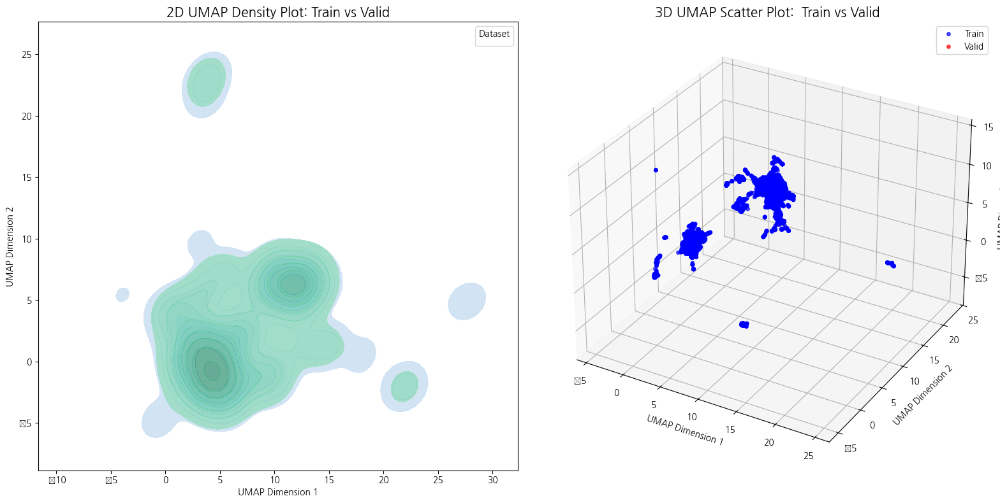

In [76]:
umap_density_plot(train_embeddings, valid_embeddings, label1="Train", label2="Valid")

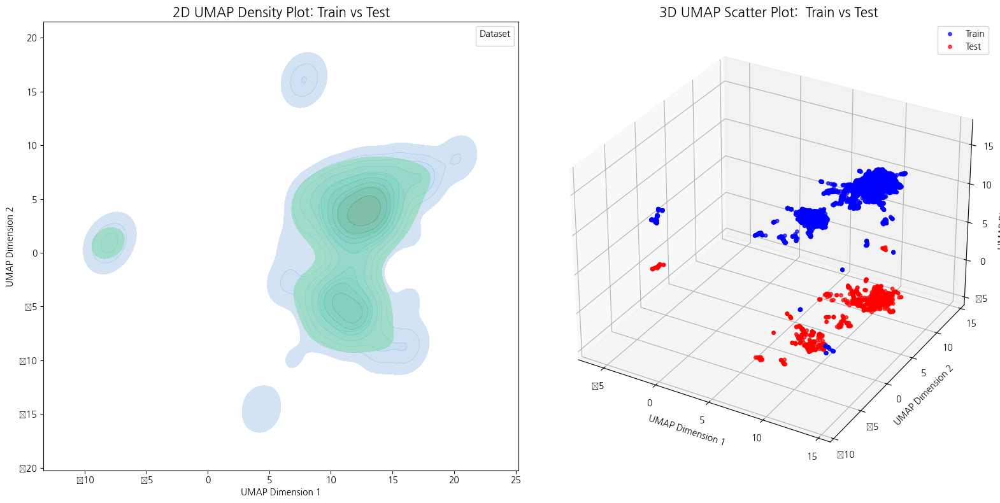

In [77]:
umap_density_plot(train_embeddings, test_embeddings, label1="Train", label2="Test")

### 3.3 PCA → TSNE & UMAP

In [79]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import numpy as np

def pca_scatter_plot_2d_3d(train_embeddings, test_embeddings, label1="Train", label2="Test"):
    
    embeddings = np.vstack([train_embeddings, test_embeddings])
    labels = [label1] * len(train_embeddings) + [label2] * len(test_embeddings)
    
    # PCA 모델 생성 및 학습
    pca = PCA(n_components=3, random_state=42)
    embeddings_pca = pca.fit_transform(embeddings)

    # PCA로 변환된 2D 및 3D 결과 분리
    x_2d, y_2d = embeddings_pca[:, 0], embeddings_pca[:, 1]
    x_3d, y_3d, z_3d = embeddings_pca[:, 0], embeddings_pca[:, 1], embeddings_pca[:, 2]

    # 1x2 레이아웃 생성
    fig = plt.figure(figsize=(16, 8))

    # 2D PCA Scatter Plot
    ax1 = fig.add_subplot(1, 2, 1)
    sns.scatterplot(
        x=x_2d, y=y_2d,
        hue=labels, palette="Set1", alpha=0.7, ax=ax1, s=10
    )
    ax1.set_title("2D PCA Scatter Plot: " + label1 + ' vs ' + label2, fontsize=15)
    ax1.set_xlabel("PCA Component 1")
    ax1.set_ylabel("PCA Component 2")
    ax1.legend(title="Dataset")

    # 3D PCA Scatter Plot
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    for label, color in zip([label1, label2], ['blue', 'orange']):
        idx = [i for i, lbl in enumerate(labels) if lbl == label]
        ax2.scatter(
            [x_3d[i] for i in idx],
            [y_3d[i] for i in idx],
            [z_3d[i] for i in idx],
            label=label, alpha=0.7, s=10
        )
    ax2.set_title("3D PCA Scatter Plot:  " + label1 + ' vs ' + label2, fontsize=15)
    ax2.set_xlabel("PCA Component 1")
    ax2.set_ylabel("PCA Component 2")
    ax2.set_zlabel("PCA Component 3")
    ax2.legend(loc="best")

    # 플롯 레이아웃 조정
    plt.tight_layout()
    plt.show()

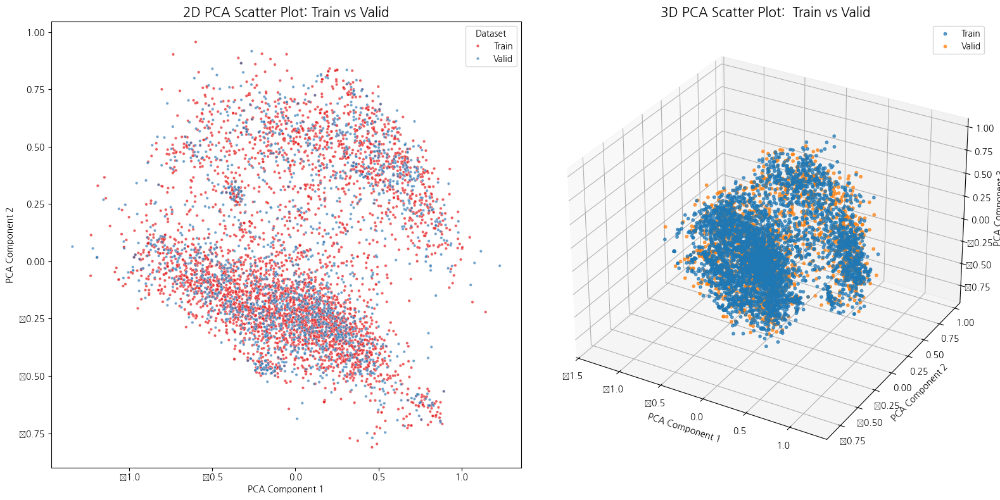

In [80]:
pca_scatter_plot_2d_3d(train_embeddings, valid_embeddings, label1="Train", label2="Valid")

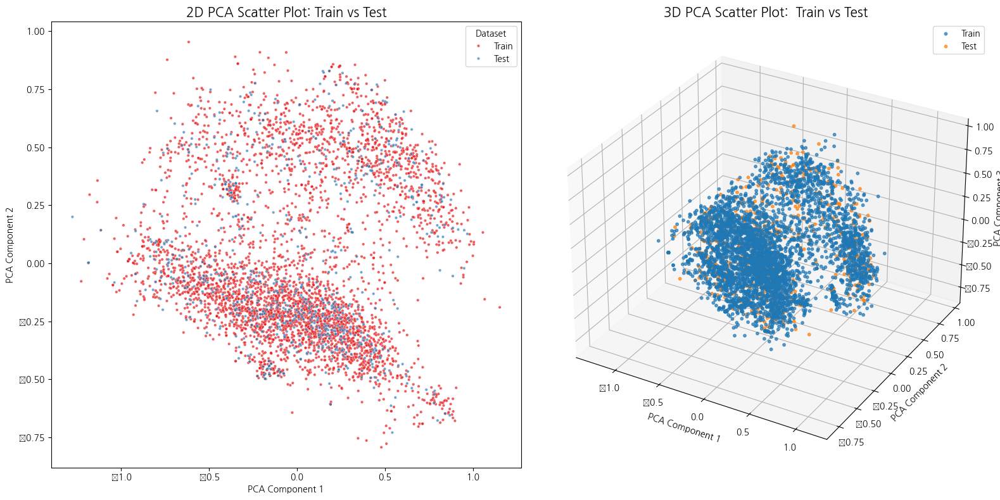

In [81]:
pca_scatter_plot_2d_3d(train_embeddings, test_embeddings, label1="Train", label2="Test")

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def pca_tsne_umap_visualization(train_embeddings, test_embeddings, label1="Train", label2="Test", n_pca_components=50):
    
    # Step 1: PCA 적용
    embeddings = np.vstack([train_embeddings, test_embeddings])
    labels = [label1] * len(train_embeddings) + [label2] * len(test_embeddings)
    
    pca = PCA(n_components=n_pca_components, random_state=42)
    embeddings_pca = pca.fit_transform(embeddings)
    
    print(f"PCA 적용 후 데이터 차원: {embeddings_pca.shape}")

    # Step 2: TSNE 2D
    tsne_2d = TSNE(n_components=2, random_state=42)
    tsne_2d_result = tsne_2d.fit_transform(embeddings_pca)

    # Step 3: UMAP 2D
    umap_2d = umap.UMAP(n_components=2, random_state=42)
    umap_2d_result = umap_2d.fit_transform(embeddings_pca)

    # Step 4: 시각화
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    
    # TSNE 2D 시각화
    sns.scatterplot(
        x=tsne_2d_result[:, 0], y=tsne_2d_result[:, 1], hue=labels,
        palette="Set1", alpha=0.7, ax=axes[0], s=10
    )
    axes[0].set_title("t-SNE after PCA", fontsize=15)
    axes[0].set_xlabel("t-SNE Dimension 1")
    axes[0].set_ylabel("t-SNE Dimension 2")
    axes[0].legend(title="Dataset")

    # UMAP 2D 시각화
    sns.scatterplot(
        x=umap_2d_result[:, 0], y=umap_2d_result[:, 1], hue=labels,
        palette="Set2", alpha=0.7, ax=axes[1], s=10
    )
    axes[1].set_title("UMAP after PCA", fontsize=15)
    axes[1].set_xlabel("UMAP Dimension 1")
    axes[1].set_ylabel("UMAP Dimension 2")
    axes[1].legend(title="Dataset")

    plt.tight_layout()
    plt.show()


PCA 적용 후 데이터 차원: (6013, 50)


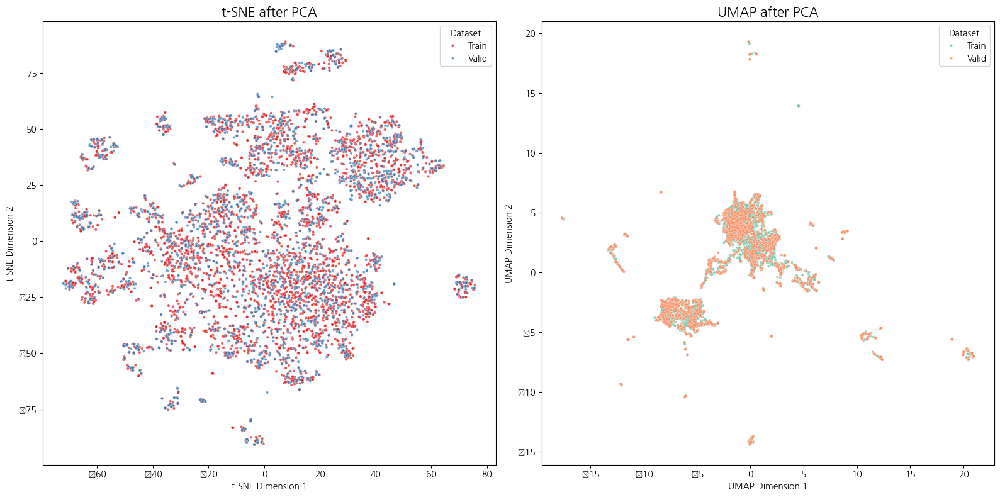

In [86]:
pca_tsne_umap_visualization( train_embeddings, valid_embeddings, label1="Train", label2="Valid")

PCA 적용 후 데이터 차원: (4858, 50)


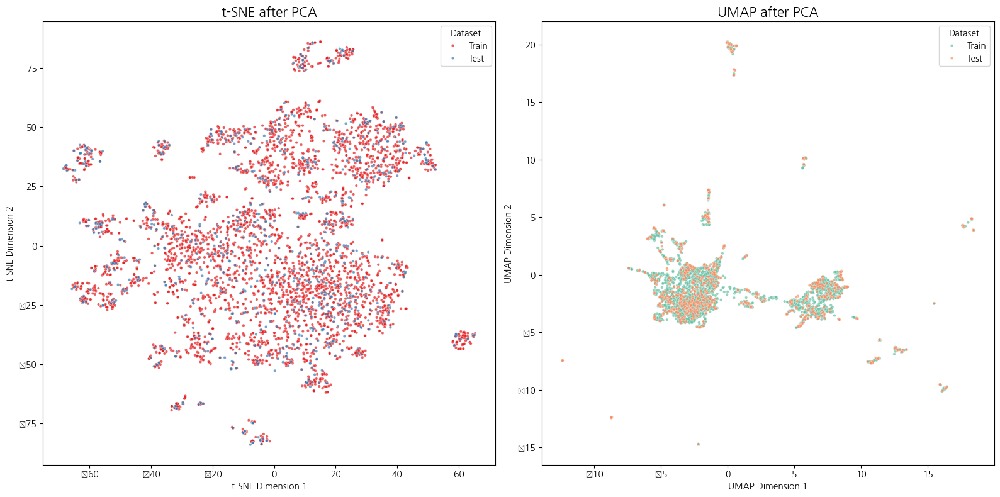

In [85]:
pca_tsne_umap_visualization( train_embeddings, test_embeddings, label1="Train", label2="Test")

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def pca_tsne_umap_density(train_embeddings, test_embeddings, label1="Train", label2="Test", n_pca_components=50):
    
    
    # Step 1: PCA 적용
    embeddings = np.vstack([train_embeddings, test_embeddings])
    labels = [label1] * len(train_embeddings) + [label2] * len(test_embeddings)
    
    pca = PCA(n_components=n_pca_components, random_state=42)
    embeddings_pca = pca.fit_transform(embeddings)

    # Step 2: t-SNE 2D
    tsne_2d = TSNE(n_components=2, random_state=42)
    tsne_2d_result = tsne_2d.fit_transform(embeddings_pca)

    # Step 3: UMAP 2D
    umap_2d = umap.UMAP(n_components=2, random_state=42)
    umap_2d_result = umap_2d.fit_transform(embeddings_pca)

    # Step 4: 밀도 플롯 시각화
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))

    # t-SNE 밀도 플롯
    sns.kdeplot(
        x=tsne_2d_result[:, 0], y=tsne_2d_result[:, 1],
        hue=labels, fill=True, palette="Set1", alpha=0.5, ax=axes[0]
    )
    axes[0].set_title("t-SNE Density Plot after PCA", fontsize=15)
    axes[0].set_xlabel("t-SNE Dimension 1")
    axes[0].set_ylabel("t-SNE Dimension 2")
    axes[0].legend(title="Dataset")

    # UMAP 밀도 플롯
    sns.kdeplot(
        x=umap_2d_result[:, 0], y=umap_2d_result[:, 1],
        hue=labels, fill=True, palette="Set2", alpha=0.5, ax=axes[1]
    )
    axes[1].set_title("UMAP Density Plot after PCA", fontsize=15)
    axes[1].set_xlabel("UMAP Dimension 1")
    axes[1].set_ylabel("UMAP Dimension 2")
    axes[1].legend(title="Dataset")

    plt.tight_layout()
    plt.show()

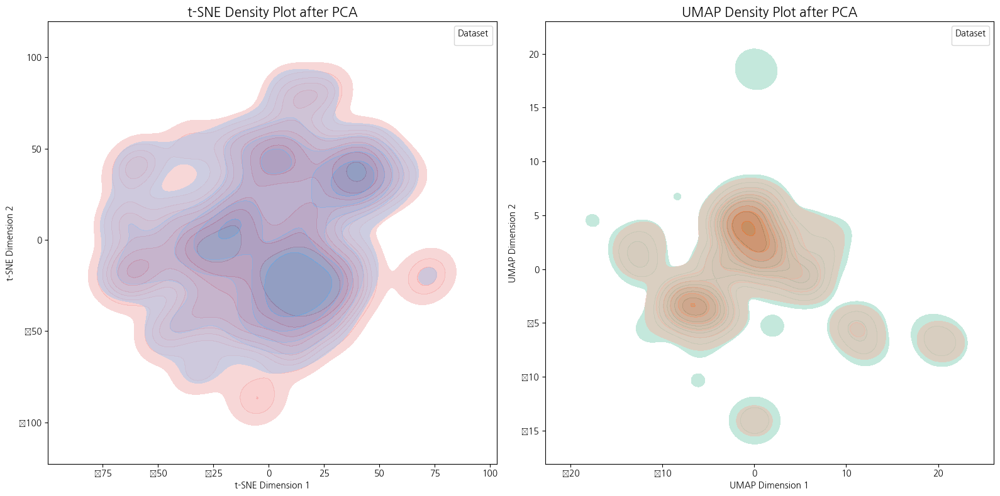

In [91]:
pca_tsne_umap_density(train_embeddings, valid_embeddings, label1="Train", label2="Valid")

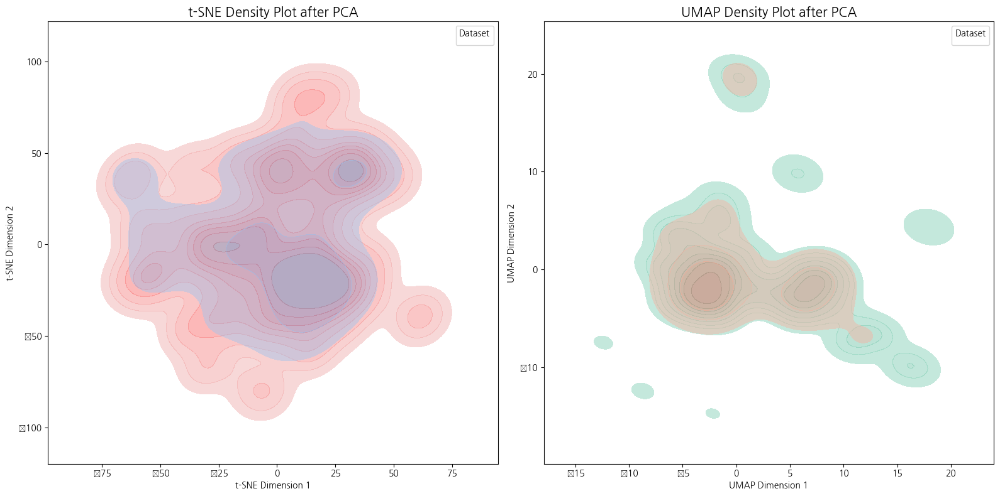

In [90]:
pca_tsne_umap_density(train_embeddings, test_embeddings, label1="Train", label2="Test")

## 4. Evidently AI

In [30]:
train['class'] = train['class'].astype('object')
valid['class'] = valid['class'].astype('object')
test['class'] = test['class'].astype('object')

In [ ]:
from evidently import ColumnMapping

reference_df = pd.DataFrame(train_embeddings, 
                            columns=[f"dim_{i}" for i in range(train_embeddings.shape[1])])
current_df = pd.DataFrame(test_embeddings, 
                            columns=[f"dim_{i}" for i in range(test_embeddings.shape[1])])

column_mapping = ColumnMapping(
    embeddings={'small_subset': reference_df.columns[:50]}
)

In [35]:
from evidently.metrics import EmbeddingsDriftMetric
from evidently.report import Report
from evidently.metrics.data_drift.embedding_drift_methods import ratio

report = Report(metrics=[
    EmbeddingsDriftMetric('small_subset', 
                         drift_method = ratio(
                              component_stattest = 'wasserstein',
                              component_stattest_threshold = 0.1,
                              threshold = 0.2,
                              pca_components = None,
                          )
    )
])

report.run(reference_data = reference_df, current_data = current_df, 
           column_mapping = column_mapping)
report

In [36]:
from evidently import ColumnMapping

reference_df = pd.DataFrame(train_embeddings, 
                            columns=[f"dim_{i}" for i in range(train_embeddings.shape[1])])
current_df = pd.DataFrame(valid_embeddings, 
                            columns=[f"dim_{i}" for i in range(valid_embeddings.shape[1])])

column_mapping = ColumnMapping(
    embeddings={'small_subset': reference_df.columns[:50]}
)

In [37]:
from evidently.metrics import EmbeddingsDriftMetric
from evidently.report import Report
from evidently.metrics.data_drift.embedding_drift_methods import ratio

report = Report(metrics=[
    EmbeddingsDriftMetric('small_subset', 
                         drift_method = ratio(
                              component_stattest = 'wasserstein',
                              component_stattest_threshold = 0.1,
                              threshold = 0.2,
                              pca_components = None,
                          )
    )
])

report.run(reference_data = reference_df, current_data = current_df, 
           column_mapping = column_mapping)
report

<train vs test>

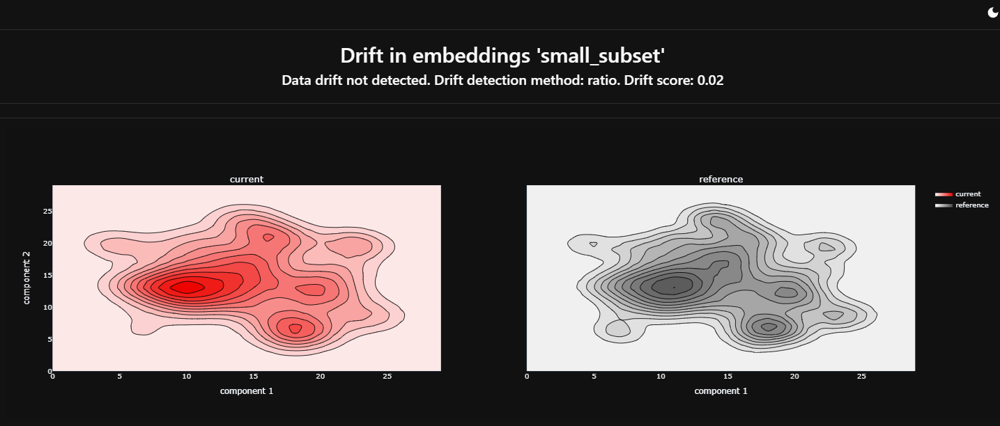

<train vs valid>

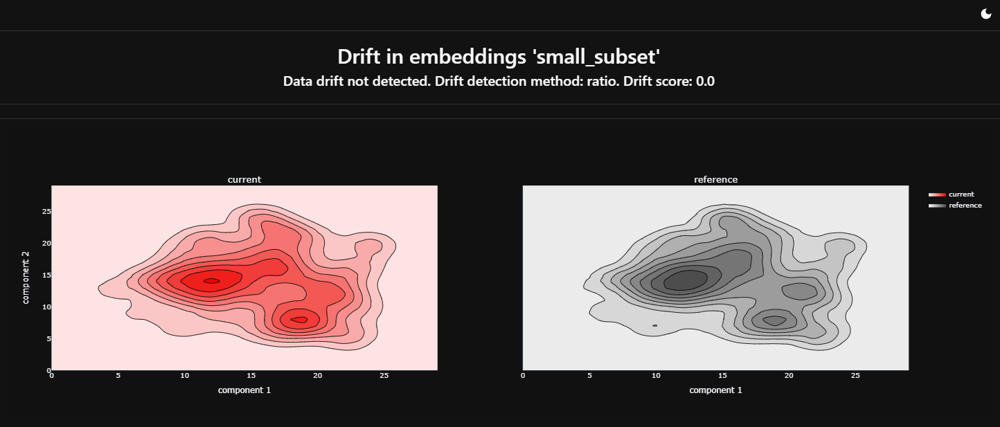
